# 3: Calcolo dell'evapotraspirazione con il modello di Prospero e Penman - Monteith

In [1]:
import os
import datetime
import numpy as np
import pandas as pd
import xarray as xr
from matplotlib import rc
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib.dates as mdates
import plotly.graph_objects as go

## - Simfile modificato

import static oms3.SimBuilder.instance as OMS3
import static oms3.SimBuilder.*
def home = oms_prj

def startDate	= "2020-01-01 00:00"
def endDate		= "2022-01-01 00:00"
def basin 		= "Cavone"
def ID			= 1
def timestep 	= 60
def lab         = "totalstress" // potential  -  totalstress  -  environmentalstress  -  waterstress

OMS3.sim {
     resource "$oms_prj/lib"
     model(while:"readerAirTemperature.doProcess")	{
        components {
				
			//Input-Output components
			"input"     "it.geoframe.blogspot.geoet.inout.InputReaderMain"
			"output"    "it.geoframe.blogspot.geoet.inout.OutputWriterMain"
			
			//GEOET components
			"stressfactor"			"it.geoframe.blogspot.geoet.stressfactor.solver.ProsperoPMStressFactorSolverMain"
			"prospero"             	"it.geoframe.blogspot.geoet.prospero.solver.ProsperoSolverMain"
			"soilevaporation"		"it.geoframe.blogspot.geoet.soilevaporation.solver.PMEvaporationFromSoilAfterCanopySolverMain"
			"totalET"				"it.geoframe.blogspot.geoet.totalEvapoTranspiration.TotalEvapoTranspirationSolverMain"
			
			
				
			"readerAirTemperature"              	"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerWindVelocity"             	"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerRelativeHumidity"            	"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerShortWaveDirectRadiation"		"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerShortWaveDiffuseRadiation"	"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerLongWaveRadiation"			"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerNetRadiation"					"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerLeafAreaIndex"				"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerAtmosphericPressure"         "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerSoilHeatFlux"                "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"	
			"readerSoilMoisture"                "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"	
			"readerCentroids"				    "org.hortonmachine.gears.io.shapefile.OmsShapefileFeatureReader"		       
			"readerDem"							"org.hortonmachine.gears.io.rasterreader.OmsRasterReader" 
			
			"writerLatentHeat"							"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"  
			"writerLatentHeatShade"						"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"   
			"writerFluxEvaporation"						"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter" 
			"writerEvapoTranspiration"					"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter" 
			"writerFluxTranspiration"					"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"
			"writerTranspiration"						"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"
			"writerEvaporation"							"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"
			"writerFluxEvapoTranspiration"				"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"		
			"writerSensibleHeat"						"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"  
			"writerSensibleHeatShade"					"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"  
			"writerLeafTemperature"						"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter" 
			"writerLeafTemperatureShade"				"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter" 
			"writerCanopy"								"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"      
			"writerRadiation"							"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"           
			"writerRadiationShade"						"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"
			"writerRadiationSoil"						"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"
			"writerVPD"									"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"	
	 
			}
			parameter{		

				// GEOgraphy PARAMETERS
				"readerDem.file"			"${home}/data/${basin}/${ID}/dem_${ID}.tif"	 
				"readerCentroids.file"		"${home}/data/${basin}/${ID}/centroids_ID_${ID}.shp"
				"input.idCentroids"			"ID"
				"input.centroidElevation"	"Elevation"

				// PARAMETERS
				"prospero.canopyHeight"			4
				"prospero.typeOfCanopy" 		"multilayer"
		        
		        "output.doFullPrint"			true
				"input.tStartDate"				"${startDate}"
				"input.temporalStep"			"${timestep}"
				
				//Parameters for the Radiation Stress
				"stressfactor.useRadiationStress" true
				  
				"stressfactor.alpha" 		0.005
				"stressfactor.theta" 		0.85
				
				//Parameter for the Vapour Pressure Deficit Stress
				"stressfactor.useVDPStress" true
				
				"stressfactor.VPD0" 	5.0 
				
				//Parameters for the Temperature Stress
				"stressfactor.useTemperatureStress" true    
				   	
				"stressfactor.Tl" 		"-5.0"
				"stressfactor.T0" 		20.0
				"stressfactor.Th" 		45.0 
				
				//Parameters for the Water Stress 
				"stressfactor.useWaterStress" true 
				     	
				"stressfactor.waterWiltingPoint"		0.06
				"stressfactor.waterFieldCapacity"	0.18
				"stressfactor.rootsDepth"  			1.0
				"stressfactor.evaporationDepth"  	0.25
				"stressfactor.depletionFraction" 	0.4
				"stressfactor.cropCoefficient" 		0.45
								
				//	READERS				
				"readerAirTemperature.file"         			"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/temp.csv"
				"readerAirTemperature.idfield"          		"ID"		
				"readerAirTemperature.tStart"           		"${startDate}"
				"readerAirTemperature.tEnd"         			"${endDate}"
				"readerAirTemperature.tTimestep"            	"${timestep}"
				"readerAirTemperature.fileNovalue"          	"-9999.0"
								
				"readerWindVelocity.file"                       "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/vento.csv"/
				"readerWindVelocity.idfield"                    "ID"		
				"readerWindVelocity.tStart"                     "${startDate}"
				"readerWindVelocity.tEnd"                       "${endDate}"
				"readerWindVelocity.tTimestep"                  "${timestep}"
				"readerWindVelocity.fileNovalue"                "-9999.0"
								
				"readerRelativeHumidity.file"                   "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/umidità.csv"
				"readerRelativeHumidity.idfield"                "ID"		
				"readerRelativeHumidity.tStart"                 "${startDate}"
				"readerRelativeHumidity.tEnd"                   "${endDate}"
				"readerRelativeHumidity.tTimestep"              "${timestep}"
				"readerRelativeHumidity.fileNovalue"            "-9999.0"
								
				"readerShortWaveDirectRadiation.file"			"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/Radiation/ShortwaveDirect_1.csv"
				"readerShortWaveDirectRadiation.idfield"		"ID"
				"readerShortWaveDirectRadiation.tStart"			"${startDate}"
				"readerShortWaveDirectRadiation.tEnd"			"${endDate}"
				"readerShortWaveDirectRadiation.tTimestep"		"${timestep}"
				"readerShortWaveDirectRadiation.fileNovalue"	"-9999.0"				
						
				"readerShortWaveDiffuseRadiation.file"			"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/Radiation/ShortwaveDiffuse_1.csv"
				"readerShortWaveDiffuseRadiation.idfield"		"ID"
				"readerShortWaveDiffuseRadiation.tStart"		"${startDate}"
				"readerShortWaveDiffuseRadiation.tEnd"			"${endDate}"
				"readerShortWaveDiffuseRadiation.tTimestep"		"${timestep}"
				"readerShortWaveDiffuseRadiation.fileNovalue"	"-9999.0"				
					
				"readerLongWaveRadiation.file"        			"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/Radiation/LongDownwelling_1.csv"
				"readerLongWaveRadiation.idfield"     			"ID"
				"readerLongWaveRadiation.tStart"      			"${startDate}"
				"readerLongWaveRadiation.tEnd"        			"${endDate}"
				"readerLongWaveRadiation.tTimestep"   			"${timestep}"  
				"readerLongWaveRadiation.fileNovalue" 			"-9999.0"
							
				"readerNetRadiation.file"        				"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/Radiation/Net_1.csv"
				"readerNetRadiation.idfield"     				"ID"
				"readerNetRadiation.tStart"      				"${startDate}"
				"readerNetRadiation.tEnd"        				"${endDate}"
				"readerNetRadiation.tTimestep"   				"${timestep}"  
				"readerNetRadiation.fileNovalue" 				"-9999.0"
						
				"readerAtmosphericPressure.file"                "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/p_atm.csv"
				"readerAtmosphericPressure.idfield"             "ID"		
				"readerAtmosphericPressure.tStart"              "${startDate}"
				"readerAtmosphericPressure.tEnd"                "${endDate}"
				"readerAtmosphericPressure.tTimestep"           "${timestep}"
				"readerAtmosphericPressure.fileNovalue"         "-9999.0"
								
				"readerSoilHeatFlux.file"                       "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/GHF_9999.csv"
                "readerSoilHeatFlux.idfield"                    "ID"		
                "readerSoilHeatFlux.tStart"                     "${startDate}"
                "readerSoilHeatFlux.tEnd"                       "${endDate}"
                "readerSoilHeatFlux.tTimestep"                  "${timestep}"
                "readerSoilHeatFlux.fileNovalue"                "-9999.0"
                
                "readerLeafAreaIndex.file"         				"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/LAI_pist.csv"
				"readerLeafAreaIndex.idfield"      				"ID"  
				"readerLeafAreaIndex.tStart"       				"${startDate}"
				"readerLeafAreaIndex.tEnd"         				"${endDate}"
				"readerLeafAreaIndex.tTimestep"    				"${timestep}"
				"readerLeafAreaIndex.fileNovalue"  				"-9999.0" 			
		
				"readerSoilMoisture.file"                       "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/SoilMoisture.csv"
                "readerSoilMoisture.idfield"                    "ID"		
                "readerSoilMoisture.tStart"                     "${startDate}"
                "readerSoilMoisture.tEnd"                       "${endDate}"
                "readerSoilMoisture.tTimestep"                  "${timestep}"
                "readerSoilMoisture.fileNovalue"                "-9999.0"																				
	
                //	WRITERS				              
				"writerLatentHeat.file"        				"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/LH_Sun_${ID}_${lab}.csv"
				"writerLatentHeat.tStart"       			"${startDate}"
				"writerLatentHeat.tTimestep"   				"${timestep}"
					
				"writerLatentHeatShade.file"        		"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/LH_Shade_${ID}_${lab}.csv"
				"writerLatentHeatShade.tStart"       		"${startDate}"
				"writerLatentHeatShade.tTimestep"   		"${timestep}"

				"writerTranspiration.file"        			"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/Transpiration_${ID}_${lab}.csv"//"${home}/output/${basin}/${ID}/Transpiration_${ID}_${lab}.csv" 
				"writerTranspiration.tStart"       			"${startDate}"
				"writerTranspiration.tTimestep"   			"${timestep}"
							        		        
				"writerEvapoTranspiration.file"        		"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/EvapoTranspiration_${ID}_${lab}.csv"
				"writerEvapoTranspiration.tStart"       	"${startDate}"
				"writerEvapoTranspiration.tTimestep"		"${timestep}"
				
				"writerFluxTranspiration.file"        		"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/FluxTranspiration_${ID}_${lab}.csv"
				"writerFluxTranspiration.tStart"       		"${startDate}"
				"writerFluxTranspiration.tTimestep"			"${timestep}"
				
				"writerFluxEvaporation.file"        		"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/FluxEvaporation_${ID}_${lab}.csv" 
				"writerFluxEvaporation.tStart"       		"${startDate}"
				"writerFluxEvaporation.tTimestep"			"${timestep}"
				
				"writerEvaporation.file"        			"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/Evaporation_${ID}_${lab}.csv"
				"writerEvaporation.tStart"       			"${startDate}"
				"writerEvaporation.tTimestep"				"${timestep}"
				
				"writerFluxEvapoTranspiration.file"        	"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/FluxEvapoTranspiration_${ID}_${lab}.csv"
				"writerFluxEvapoTranspiration.tStart"     	"${startDate}"
				"writerFluxEvapoTranspiration.tTimestep"	"${timestep}"   					        					        					        					        	
			      					        					        					        					        	      					        					        					        					        	      					        					        					        					        	
				"writerLeafTemperature.file"				"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/LT_Sun_${ID}_${lab}.csv"
				"writerLeafTemperature.tStart"				"${startDate}"
				"writerLeafTemperature.tTimestep"			"${timestep}"       
					
				"writerLeafTemperatureShade.file"			"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/LT_Shade_${ID}_${lab}.csv"
				"writerLeafTemperatureShade.tStart"			"${startDate}"
				"writerLeafTemperatureShade.tTimestep"		"${timestep}"       
					
				"writerRadiation.file"						"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/RadiationCanopySun_${ID}_${lab}.csv"
				"writerRadiation.tStart"					"${startDate}"
				"writerRadiation.tTimestep"					"${timestep}"       
					
				"writerRadiationShade.file"					"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/RadiationCanopyShade_${ID}_${lab}.csv" 
				"writerRadiationShade.tStart"				"${startDate}"
				"writerRadiationShade.tTimestep"			"${timestep}"       
				
				"writerRadiationSoil.file"					"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/RadiationSoil_${ID}_${lab}.csv" 
				"writerRadiationSoil.tStart"				"${startDate}"
				"writerRadiationSoil.tTimestep"				"${timestep}"       
					
				"writerCanopy.file"							"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/canopy_${ID}_${lab}.csv"//
				"writerCanopy.tStart"						"${startDate}"
				"writerCanopy.tTimestep"					"${timestep}"       
					
				"writerSensibleHeat.file"					"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/SH_Sun_${ID}_${lab}.csv" 
				"writerSensibleHeat.tStart"					"${startDate}"
				"writerSensibleHeat.tTimestep"				"${timestep}"       
				
				"writerSensibleHeatShade.file"				"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/SH_Shade_${ID}_${lab}.csv"
				"writerSensibleHeatShade.tStart"			"${startDate}"
				"writerSensibleHeatShade.tTimestep"			"${timestep}" 
				
				"writerVPD.file"							"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/VPD_${ID}_${lab}.csv"
				"writerVPD.tStart"							"${startDate}"
				"writerVPD.tTimestep"						"${timestep}"
				
            }
            connect	{
                "input.doProcess"                   	"prospero.doProcess" 
                "prospero.doPro"						"soilevaporation.doPro"
				"soilevaporation.doProcessOut"        	"output.doProcessOut"
				
				"soilevaporation.evaporation"			"totalET.evaporation"
                "prospero.transpiration"				"totalET.transpiration"
                
                "readerAirTemperature.outData"					"input.inAirTemperature"
				"readerWindVelocity.outData"		 			"input.inWindVelocity"
				"readerRelativeHumidity.outData"		 		"input.inRelativeHumidity"
				"readerShortWaveDirectRadiation.outData"		"input.inShortWaveRadiationDirect"
				"readerShortWaveDiffuseRadiation.outData"		"input.inShortWaveRadiationDiffuse"
				"readerLongWaveRadiation.outData"				"input.inLongWaveRadiation"
				"readerNetRadiation.outData"					"input.inNetRadiation"
				"readerAtmosphericPressure.outData"				"input.inAtmosphericPressure"
				"readerLeafAreaIndex.outData"					"input.inLeafAreaIndex"	
				"readerSoilHeatFlux.outData"					"input.inSoilFlux"	
				"readerSoilMoisture.outData"					"input.inSoilMoisture"
				
				"stressfactor.stressSun"				"prospero.stressSun"
				"stressfactor.stressShade"				"prospero.stressShade"
				"stressfactor.evaporationStress"		"soilevaporation.evaporationStressWater"
				
				"readerCentroids.geodata"				"input.inCentroids"
				"readerDem.outRaster"					"input.inDem"
				 									
				"output.outLatentHeatSun"					"writerLatentHeat.inData"	        			        	
				"output.outLatentHeatShade"					"writerLatentHeatShade.inData"
				"output.outEvapoTranspiration"			"writerEvapoTranspiration.inData"        		
				"output.outFluxTranspiration"				"writerFluxTranspiration.inData" 
				"output.outTranspiration"					"writerTranspiration.inData"         		
				"output.outFluxEvapoTranspiration"		"writerFluxEvapoTranspiration.inData"        	
				"output.outFluxEvaporation"				"writerFluxEvaporation.inData"
				"output.outEvaporation"				"writerEvaporation.inData"
				"output.outSensibleHeat"					"writerSensibleHeat.inData"
				"output.outSensibleHeatShade"				"writerSensibleHeatShade.inData"
				"output.outLeafTemperature"					"writerLeafTemperature.inData"
				"output.outLeafTemperatureShade"			"writerLeafTemperatureShade.inData"
				"output.outRadiation"						"writerRadiation.inData"
				"output.outRadiationShade"					"writerRadiationShade.inData"
				"output.outRadiationSoil"					"writerRadiationSoil.inData"
				"output.outCanopy"							"writerCanopy.inData"
				"output.outVapourPressureDeficit"			"writerVPD.inData"
			}
			}
		}

## Evapotraspirazione come somma di evaporazione e traspirazione

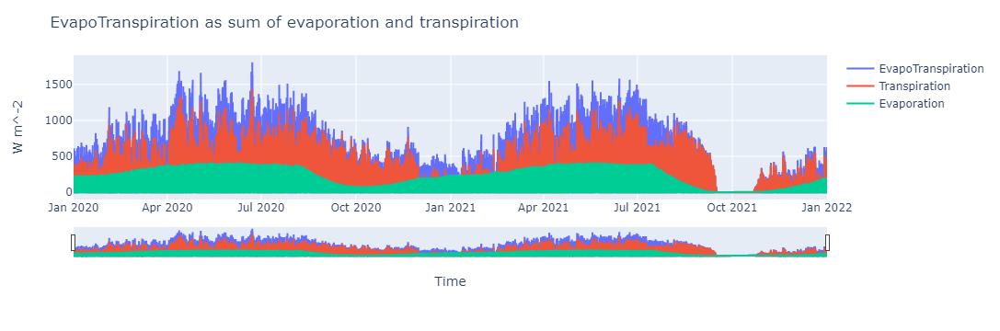

In [3]:
e = pd.read_csv('FluxEvaporation_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
e.columns = ['Datetime','Evaporation']
t = pd.read_csv('FluxTranspiration_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
t.columns = ['Datetime','Transpiration']
et = pd.read_csv('FluxEvapoTranspiration_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
et.columns = ['Datetime','EvapoTranspiration']

fig = px.line()
fig.add_trace(go.Scatter(x=et['Datetime'], y=et['EvapoTranspiration'], mode='lines', name='EvapoTranspiration'))
fig.add_trace(go.Scatter(x=t['Datetime'], y=t['Transpiration'], mode='lines', name='Transpiration'))
fig.add_trace(go.Scatter(x=e['Datetime'], y=e['Evaporation'], mode='lines', name='Evaporation'))

fig.update_layout(
    title='EvapoTranspiration as sum of evaporation and transpiration',
    xaxis_title="Time",
    yaxis_title="W m^-2")
fig.update_xaxes(rangeslider_visible=True)
fig.show()

Il grafico mostra la traspirazione calcolata con il modello di Prospero e l'evaporazione calcolata con il modello di Penman-Monteith. L'andamento dell'evaporazione è evidentemente influenzato dalla scelta di un contenuto d'acqua con andamento sinusoidale. La porzione di grafico che mostra evapotraspirazione nulla assume questo valore perchè il contenuto d'acqua è più basso del wilting point.

## Effetto degli stress sull'evapotraspirazione

In [4]:
pot = pd.read_csv('EvapoTranspiration_1_potential.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
pot.columns = ['Datetime','EvapoTranspiration']
stress1 = pd.read_csv('EvapoTranspiration_1_stress1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
stress1.columns = ['Datetime','EvapoTranspiration']
stress2 = pd.read_csv('EvapoTranspiration_1_stress2.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
stress2.columns = ['Datetime','EvapoTranspiration']
stress3 = pd.read_csv('EvapoTranspiration_1_stress3.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
stress3.columns = ['Datetime','EvapoTranspiration']
act = pd.read_csv('EvapoTranspiration_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
act.columns = ['Datetime','EvapoTranspiration']

fig = px.line()
fig.add_trace(go.Scatter(x=pot['Datetime'], y=pot['EvapoTranspiration'], mode='lines', name='Potential ET'))
fig.add_trace(go.Scatter(x=stress1['Datetime'], y=stress1['EvapoTranspiration'], mode='lines', name='Radiation Stress ET'))
fig.add_trace(go.Scatter(x=stress2['Datetime'], y=stress2['EvapoTranspiration'], mode='lines', name='Vapour pressure deficit Stress ET'))
fig.add_trace(go.Scatter(x=stress3['Datetime'], y=stress3['EvapoTranspiration'], mode='lines', name='Temperature Stress ET'))
fig.add_trace(go.Scatter(x=act['Datetime'], y=act['EvapoTranspiration'], mode='lines', name='Actual ET'))

fig.update_layout(
    title='Prospero and Penman-Monteith EvapoTranspiration applying stress factors one by one',
    xaxis_title="Time",
    yaxis_title="EvapoTranspiration [mm]",)
fig.update_xaxes(rangeslider_visible=True)
fig.show()

FileNotFoundError: [Errno 2] No such file or directory: 'EvapoTranspiration_1_potential.csv'

Come si può vedere dal grafico, nelle condizioni prese in esame gli stress hanno poco peso sull'evapotraspirazione effettiva, eccetto per il water stress e in misura minore il temperature stress.

## Temperatura delle foglie

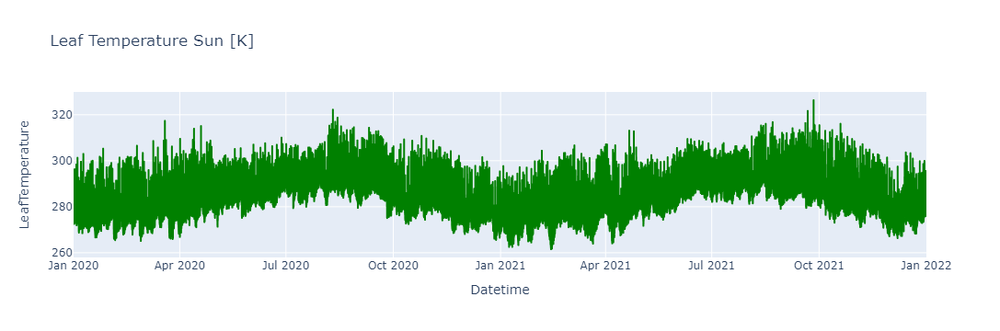

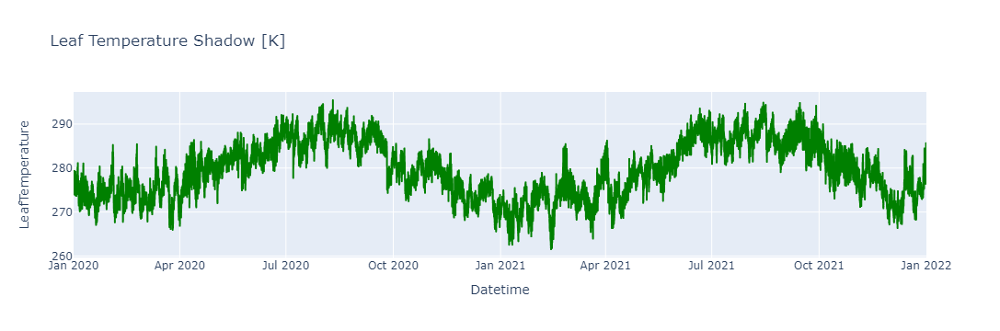

In [9]:
df = pd.read_csv('LT_Sun_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Datetime','LeafTemperature']
fig = px.line(df, x='Datetime', y='LeafTemperature', title='Leaf Temperature Sun [K]')
fig.update_traces(line_color='green')
fig.show()

df = pd.read_csv('LT_Shade_1_totalstress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Datetime','LeafTemperature']
fig = px.line(df, x='Datetime', y='LeafTemperature', title='Leaf Temperature Shadow [K]')
fig.update_traces(line_color='green')
fig.show()

Come mostrato dal grafico la temperatura delle foglie segue l'andamento delle temperature stagionali. La differenza fra le temperature della parte al sole e della parte all'ombra delle foglie è significativa e può arrivare anche a più di 20 gradi.